# Exploring the Latent Space of the $\beta$-VAE

This script analyzes the latent space representations of a Variational Autoencoder (VAE) trained on a pineapple dataset. We examine the effect of different KL divergence weights (`β`) on the latent space structure:

- `β = 1.0`: Full KL divergence (standard VAE)  
- `β = 2.0`, `β = 3.0`, `β = 4.0`, `β = 5.0`, `β = 10.0`

The dataset includes three subsets for evaluation:
- **Foreground**: Cropped regions containing pineapples  
- **Background**: Areas without pineapples  
- **Full images**: Entire input images including both foreground and background

This comparison helps understand how varying the KL term influences the VAE’s encoding capability across different visual contexts.


## Implications of Latent Space Size

- **Too Small**: An undersized latent space may force the model to compress multiple factors into single dimensions, leading to entangled representations where changes in one latent variable affect multiple aspects of the output. This compression can result in poor reconstruction quality and limited control over generated outputs.

- **Too Large**: An oversized latent space can introduce redundancy, where multiple dimensions capture the same factor, or allow the model to ignore certain dimensions altogether. This scenario can lead to overfitting, where the model memorizes training data without learning meaningful representations, and may cause instability during training.

* DynamicVAE: Decoupling Reconstruction Error and Disentangled Representation Learning

## Imports

In [5]:
from torch.utils.data import Dataset, DataLoader

import pandas as pd
import torch
import os 
import cv2
import numpy as np
import matplotlib.pyplot as plt

from dataset import PineappleCountDataset
from VAE import VAE
from utils_tools import plot_samples, load_models

In [6]:
device = "cuda"

## Load checkpoints Model

Structure of the models dictionary:

```
models = {
    'last': {'kl_1_00': model, 'kl_0_25': model, ...},
    'mid': {'kl_1_00': model, 'kl_0_25': model, ...},
    'init': {'kl_1_00': model, 'kl_0_25': model, ...},
}
```

In [3]:
checkpoints_by_stage = {
    'last': {
        'kl_0_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@0.00/weights_ck_398.pt',
        'kl_1_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@1.00/weights_ck_398.pt',
        'kl_2_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@2.00/weights_ck_399.pt',
        'kl_3_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@3.00/weights_ck_398.pt',
        #'kl_4_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@1.00/weights_ck_398.pt',
    },
    'mid': {
        'kl_0_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@0.00/weights_ck_200.pt',
        'kl_1_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@1.00/weights_ck_200.pt',
        'kl_2_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@2.00/weights_ck_200.pt',
        'kl_3_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@3.00/weights_ck_200.pt',
        #'kl_1_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@1.00/weights_ck_200.pt',
    },
    'init': {
        'kl_0_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@0.00/weights_ck_0.pt',
        'kl_1_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@1.00/weights_ck_0.pt',
        'kl_2_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@2.00/weights_ck_0.pt',
        'kl_3_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@3.00/weights_ck_0.pt',
        #'kl_1_00': '/home/rtxmsi1/Downloads/VAE_training-master (2)/checkpoints/betaKL@1.00/weights_ck_0.pt',
    }
}

models = load_models(VAE=VAE, device=device, checkpoints_by_stage=checkpoints_by_stage)

## Check dataset

**Sampling Modes for Visualizing Images**

This section allows you to visualize image samples from the pineapple dataset using different modes. Each mode controls how the images are selected and displayed:

- **`foreground`**: Displays only the labeled regions containing pineapples (i.e., objects of interest).

- **`background`**: Displays only the labeled regions without pineapples (i.e., background or non-object areas).

- **`full`**: Displays the entire labeled images, including both foreground (pineapples) and background.

- **`combined`**: Displays all available images, including both labeled and unlabeled data. Useful for understanding the overall dataset distribution.

- **`random`**: Displays a random selection of images, regardless of label or content. Useful for general exploration or sanity checks.

In [7]:
dataset_path = "/home/rtxmsi1/Downloads/VAE_training-master (2)/VERTICAL_IMAGES_FG_BG_FULL_LABELS"
csv_path = "/home/rtxmsi1/Downloads/VAE_training-master (2)/DATASET.csv"

In [8]:
df = pd.read_csv(csv_path)
dataset_pineapple = PineappleCountDataset(train=True, train_ratio=0.1, 
                                          root_dir=dataset_path,
                                          resize_shape=(256, 256),
                                          dataframe=df)

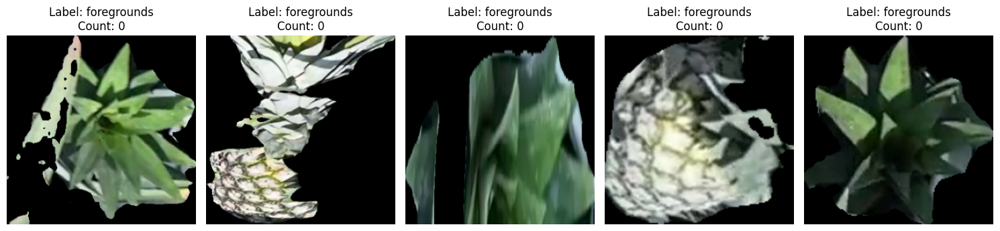

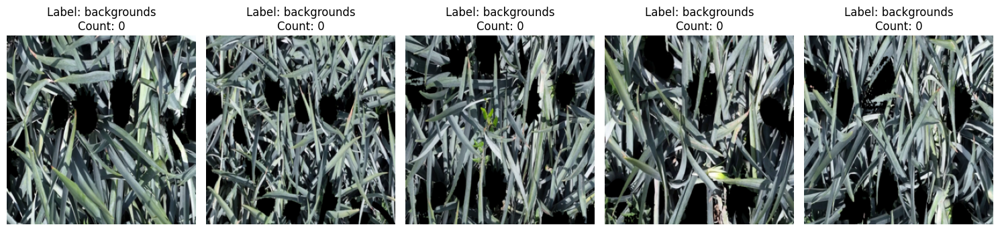

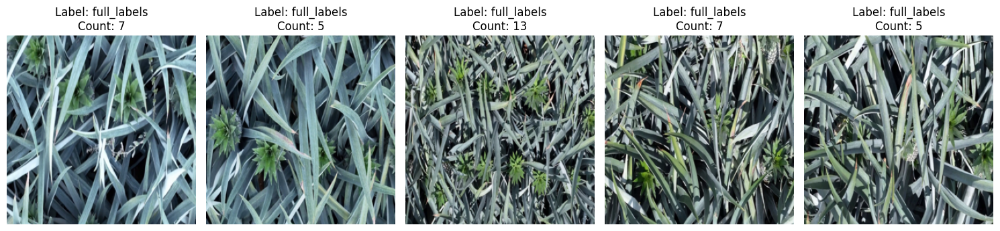

In [10]:
# Plot 5 foreground samples
plot_samples(dataset_pineapple, n=5, sample_type='foreground')
# Plot 5 background samples
plot_samples(dataset_pineapple, n=5, sample_type='background')
# Plot 5 full samples
plot_samples(dataset_pineapple, n=5, sample_type='full')

## Check reconstructions

In [9]:
from utils import visualize_reconstructions_dict, extract_latents, plot_latents_all_models, plot_latents_all_models_3d_plotly, plot_latents_all_models_3d

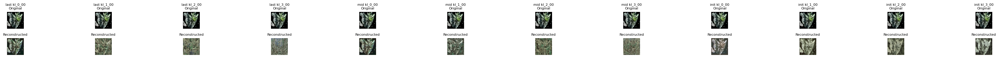

In [10]:
visualize_reconstructions_dict(
    models_dict=models,
    test_set=dataset_pineapple,
    num_samples=1,
    device=device,
    img="image"
)

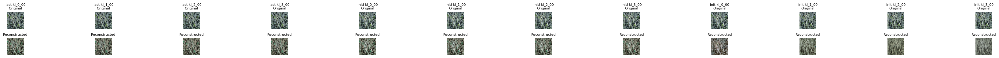

In [16]:
visualize_reconstructions_dict(
    models_dict=models,
    test_set=dataset_pineapple,
    num_samples=1,
    device=device,
    img="image"
)

## Check the latent space

In [17]:
models['last']['kl_0_00']

VAE(
  (encoder): VAE_Encoder(
    (0): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): VAE_ResidualBlock(
      (groupnorm_1): GroupNorm(32, 128, eps=1e-05, affine=True)
      (conv_1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (groupnorm_2): GroupNorm(32, 128, eps=1e-05, affine=True)
      (conv_2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (residual_layer): Identity()
    )
    (2): VAE_ResidualBlock(
      (groupnorm_1): GroupNorm(32, 128, eps=1e-05, affine=True)
      (conv_1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (groupnorm_2): GroupNorm(32, 128, eps=1e-05, affine=True)
      (conv_2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (residual_layer): Identity()
    )
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
    (4): VAE_ResidualBlock(
      (groupnorm_1): GroupNorm(32, 128, eps=1e-05, affine=True)
      (conv

In [ ]:
label_colors = {0: 'blue', 1: 'green', 2: 'red'}
label_names = dataset_pineapple.label_to_text
))

        # Get original image and convert to tensor
        original_image = test_set[index]['image']
        input_tensor = torch.tensor(original_image).unsqueeze(0).to(device)

        # Model inference

{0: 'backgrounds', 1: 'foregrounds', 2: 'full_labels'}

## Latent space visualization 

The model was trained for 400 epochs. The following checkpoints were saved:

- **Last**: The final checkpoint corresponds to epoch 399, although the best-performing epoch may be either 398 or 399.
- **Mid**: The midpoint checkpoint corresponds to epoch 200.
- **Init**: The initial checkpoint corresponds to epoch 0.

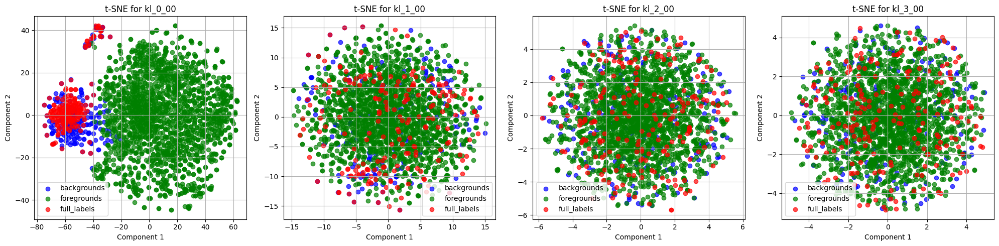

In [19]:
plot_latents_all_models(models['last'], dataset_pineapple, label_names, label_colors, device=device)

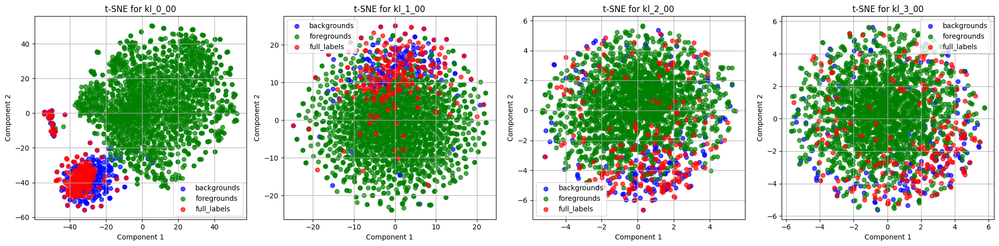

In [20]:
plot_latents_all_models(models['mid'], dataset_pineapple, label_names, label_colors, device=device)

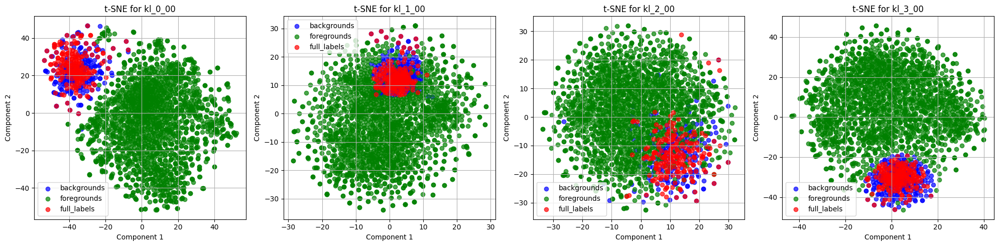

In [21]:
plot_latents_all_models(models['init'], dataset_pineapple, label_names, label_colors, device=device)

### How full image interacts?

In [ ]:
# Remove the foreground and see only the background and full image interacts
filtered_test_dataset = [sample for sample in dataset_pineapple if sample['label'] != 1]

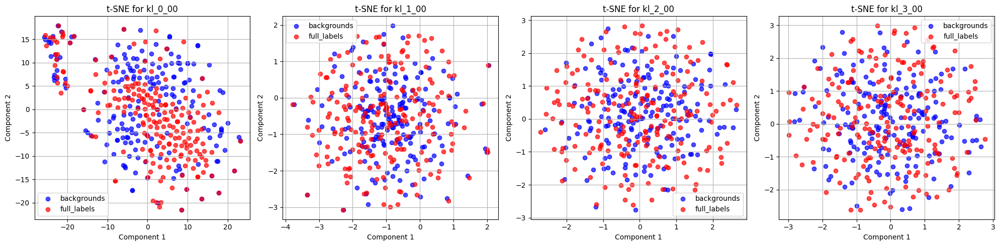

In [23]:
plot_latents_all_models(models['last'], filtered_test_dataset, label_names, label_colors, device=device)

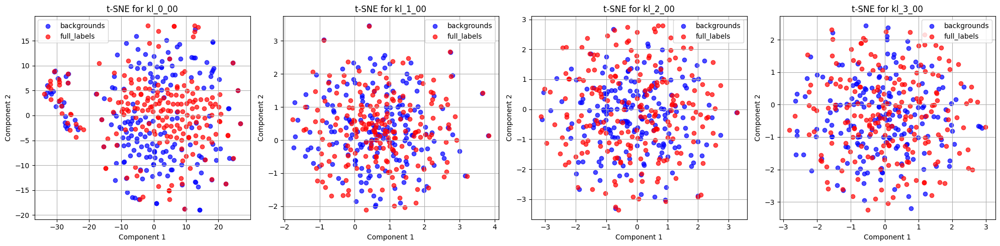

In [24]:
plot_latents_all_models(models['mid'], filtered_test_dataset, label_names, label_colors, device=device)

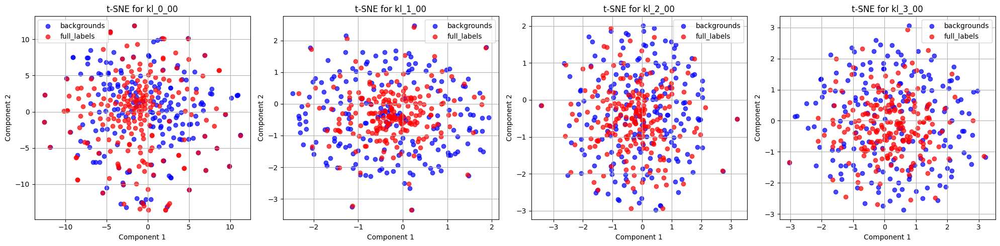

In [25]:
plot_latents_all_models(models['init'], filtered_test_dataset, label_names, label_colors, device=device)

#### Plot in 3D

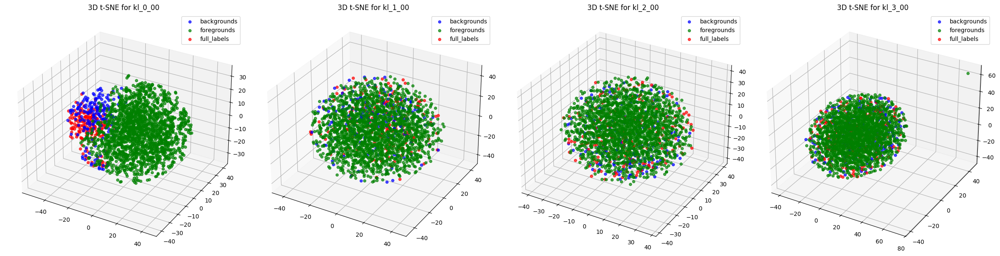

In [26]:
plot_latents_all_models_3d(models['last'], dataset_pineapple, label_names, label_colors, device=device)

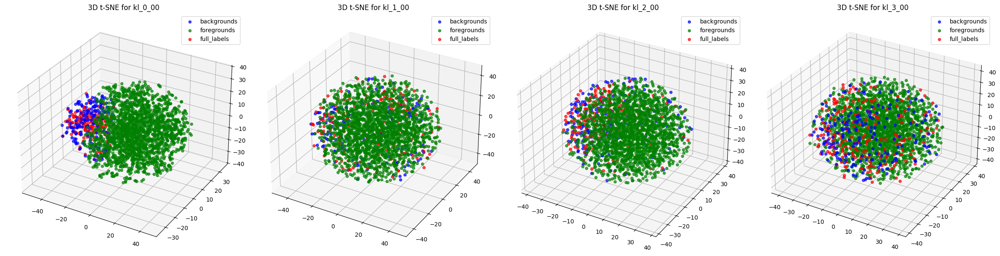

In [27]:
plot_latents_all_models_3d(models['mid'], dataset_pineapple, label_names, label_colors, device=device)

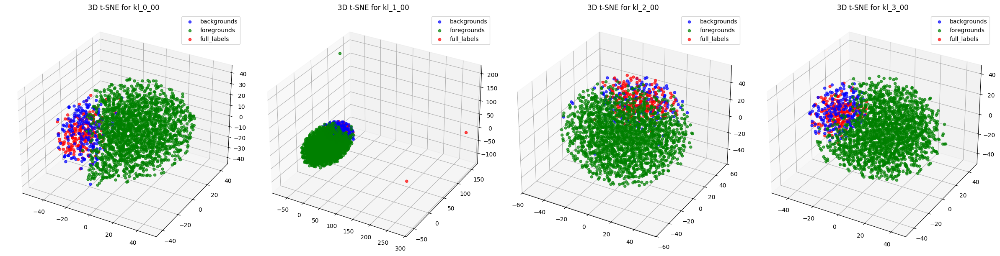

In [28]:
plot_latents_all_models_3d(models['init'], dataset_pineapple, label_names, label_colors, device=device)

## Plot bin counts pineapple

In [29]:
from utils import plot_pineapple_count_distribution, plot_latents_with_count

In [30]:
full_label_testset = [sample for sample in dataset_pineapple if sample['label'] == 2]

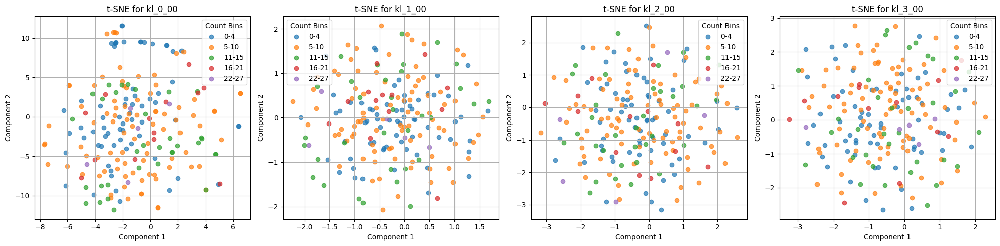

In [31]:
plot_latents_with_count(models['last'], full_label_testset, device=device)

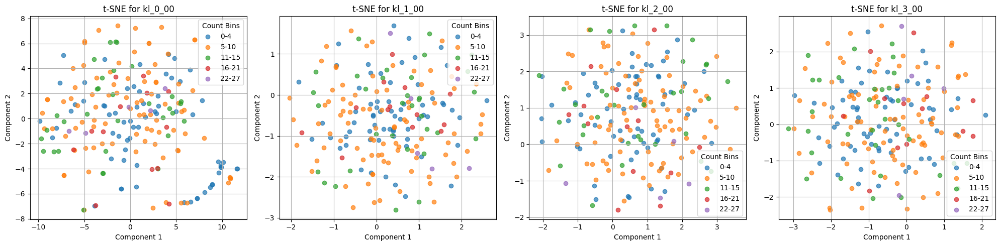

In [32]:
plot_latents_with_count(models['mid'], full_label_testset, device=device)

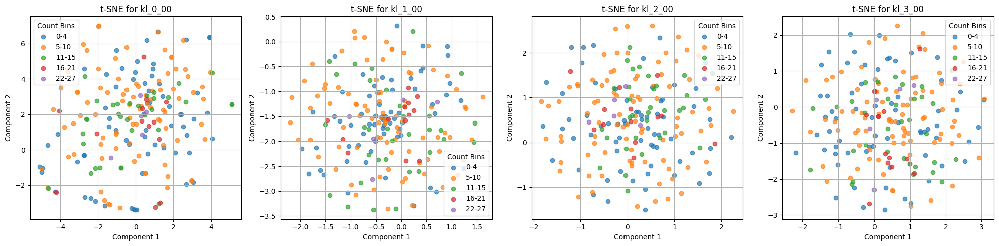

In [33]:
plot_latents_with_count(models['init'], full_label_testset, device=device)

### Train classifier Multilayer Perceptron (MLP) classifier 

- Classifier for the original flatten latent space.
- The model consists of an input layer, a hidden layer with ReLU activation, and an output layer designed for three-class. 
- To evaluate the model’s performance, a training and evaluation function is provided that uses stratified 5-fold cross-validation. 
- Trained for 20 epochs, batch size of 32, using stratified kfold to preserve the percentage of samples for each class in each fold.

In [6]:
from utils import train_evaluate_mlp

In [7]:
df = pd.read_csv(csv_path)
dataset_pineapple = PineappleCountDataset(train=True, train_ratio=0.5, 
                                          root_dir=dataset_path,
                                          resize_shape=(256, 256),
                                          dataframe=df)

In [10]:
models_level = models['init']
for i, (name, model) in enumerate(models_level.items()):
    print(f"Model layer: {name}")
    data_cleaned, label_cleaned = extract_latents(model, dataset_pineapple, target_key="label", device=device)
    f1_scores = train_evaluate_mlp(data_cleaned, label_cleaned)
    print(f1_scores)

Model layer: kl_0_00
Fold 1: F1 Score = 0.6630
Fold 2: F1 Score = 0.7498
Fold 3: F1 Score = 0.6281
Fold 4: F1 Score = 0.7498
Fold 5: F1 Score = 0.7312

Average F1 Score over 5 folds: 0.7044
[0.6630282315184877, 0.7498165984919272, 0.6280728569509385, 0.7497915940450003, 0.7311789264336594]
Model layer: kl_1_00
Fold 1: F1 Score = 0.7263
Fold 2: F1 Score = 0.7026
Fold 3: F1 Score = 0.6996
Fold 4: F1 Score = 0.7076
Fold 5: F1 Score = 0.6846

Average F1 Score over 5 folds: 0.7041
[0.7263317853419377, 0.7025729852366259, 0.6995562291618601, 0.7076431144762764, 0.684567580487602]
Model layer: kl_2_00
Fold 1: F1 Score = 0.6261
Fold 2: F1 Score = 0.6368
Fold 3: F1 Score = 0.6418
Fold 4: F1 Score = 0.6445
Fold 5: F1 Score = 0.6191

Average F1 Score over 5 folds: 0.6337
[0.6261255273340306, 0.6367891697832411, 0.6418316850840039, 0.6444879193559298, 0.6190660798697911]
Model layer: kl_3_00
Fold 1: F1 Score = 0.6906
Fold 2: F1 Score = 0.6818
Fold 3: F1 Score = 0.6953
Fold 4: F1 Score = 0.6774
Fol

In [11]:
models_level = models['mid']
for i, (name, model) in enumerate(models_level.items()):
    print(f"Model layer: {name}")
    data_cleaned, label_cleaned = extract_latents(model, dataset_pineapple, target_key="label", device=device)
    f1_scores = train_evaluate_mlp(data_cleaned, label_cleaned)
    print(f1_scores)

Model layer: kl_0_00
Fold 1: F1 Score = 0.8833
Fold 2: F1 Score = 0.9169
Fold 3: F1 Score = 0.8869
Fold 4: F1 Score = 0.9003
Fold 5: F1 Score = 0.8945

Average F1 Score over 5 folds: 0.8964
[0.8832752543329182, 0.916877183524787, 0.8868768497672331, 0.9003267717290987, 0.8944928416534891]
Model layer: kl_1_00
Fold 1: F1 Score = 0.5916
Fold 2: F1 Score = 0.6076
Fold 3: F1 Score = 0.5973
Fold 4: F1 Score = 0.6160
Fold 5: F1 Score = 0.6149

Average F1 Score over 5 folds: 0.6055
[0.5916354698108148, 0.6075739630491791, 0.5973223227637353, 0.6159852164325712, 0.6149114568016417]
Model layer: kl_2_00
Fold 1: F1 Score = 0.6229
Fold 2: F1 Score = 0.6156
Fold 3: F1 Score = 0.6089
Fold 4: F1 Score = 0.6120
Fold 5: F1 Score = 0.6277

Average F1 Score over 5 folds: 0.6174
[0.622884324150797, 0.615553338372386, 0.608935355433664, 0.611977241514474, 0.6276728886893861]
Model layer: kl_3_00
Fold 1: F1 Score = 0.6060
Fold 2: F1 Score = 0.6069
Fold 3: F1 Score = 0.6374
Fold 4: F1 Score = 0.5944
Fold 5:

In [12]:
models_level = models['last']
for i, (name, model) in enumerate(models_level.items()):
    print(f"Model layer: {name}")
    data_cleaned, label_cleaned = extract_latents(model, dataset_pineapple, target_key="label", device=device)
    f1_scores = train_evaluate_mlp(data_cleaned, label_cleaned)
    print(f1_scores)

Model layer: kl_0_00
Fold 1: F1 Score = 0.8772
Fold 2: F1 Score = 0.9060
Fold 3: F1 Score = 0.8785
Fold 4: F1 Score = 0.8945
Fold 5: F1 Score = 0.8966

Average F1 Score over 5 folds: 0.8906
[0.8772214464780174, 0.9059501600792484, 0.8784849729615276, 0.8945235839659432, 0.8966190822200047]
Model layer: kl_1_00
Fold 1: F1 Score = 0.5687
Fold 2: F1 Score = 0.5971
Fold 3: F1 Score = 0.5638
Fold 4: F1 Score = 0.5943
Fold 5: F1 Score = 0.5564

Average F1 Score over 5 folds: 0.5761
[0.5687050870882083, 0.5970632067927452, 0.5638282865555173, 0.5943407450151698, 0.5564116216973455]
Model layer: kl_2_00
Fold 1: F1 Score = 0.5877
Fold 2: F1 Score = 0.5901
Fold 3: F1 Score = 0.5810
Fold 4: F1 Score = 0.5964
Fold 5: F1 Score = 0.6011

Average F1 Score over 5 folds: 0.5913
[0.5877458721333821, 0.5901332202008854, 0.5810168843789537, 0.5964193044388781, 0.6011261294477381]
Model layer: kl_3_00
Fold 1: F1 Score = 0.5911
Fold 2: F1 Score = 0.5756
Fold 3: F1 Score = 0.5957
Fold 4: F1 Score = 0.5743
Fo

In [ ]:
# Meanshift 